In [1]:
import torch
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

# Paths
train_path = "C:\\FDS\\Project\\train"
test_path = "C:\\FDS\\Project\\test"

# Transformation for pretrained model
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  
        std=[0.229, 0.224, 0.225]    
    )
])
train_dataset = datasets.ImageFolder(train_path, transform=transform)
test_dataset = datasets.ImageFolder(test_path, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

model = models.resnet50(pretrained=True)
feature_extractor = torch.nn.Sequential(*(list(model.children())[:-1]))
feature_extractor.eval()

device =  "cpu"
feature_extractor = feature_extractor.to(device)

def extract_features(dataloader):
    features = []
    labels = []
    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.to(device)
            outputs = feature_extractor(inputs)
            outputs = outputs.view(outputs.size(0), -1) 
            features.append(outputs.cpu().numpy())
            labels.append(targets.cpu().numpy())
    return np.vstack(features), np.hstack(labels)
X_train, y_train = extract_features(train_loader)
X_test, y_test = extract_features(test_loader)

clf = LogisticRegression(max_iter=1000, class_weight='balanced')
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred, target_names=test_dataset.classes))

C:\Users\lakshman\AppData\Local\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\lakshman\AppData\Local\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


                    precision    recall  f1-score   support

collapsed_building       0.92      0.87      0.90       103
              fire       0.98      0.96      0.97       105
     flooded_areas       0.92      0.92      0.92       106
            normal       0.96      0.98      0.97       878
  traffic_incident       0.92      0.86      0.89        97

          accuracy                           0.95      1289
         macro avg       0.94      0.92      0.93      1289
      weighted avg       0.95      0.95      0.95      1289



In [2]:
import torch.nn.functional as F

resnet_with_grad = models.resnet50(pretrained=True).eval().to(device)

def get_saliency_map(img_tensor, class_idx):
    img_tensor.requires_grad_()
    resnet_with_grad.zero_grad()
    output = resnet_with_grad(img_tensor)
    score = output[0, class_idx]
    score.backward()
    saliency, _ = torch.max(img_tensor.grad.data.abs(), dim=1)
    return saliency.squeeze().cpu().numpy()

C:\Users\lakshman\AppData\Local\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\lakshman\AppData\Local\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
from torchvision.datasets import ImageFolder
import os
class ImageFolderWithPaths(datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super().__getitem__(index)
        path = self.imgs[index][0]
        return original_tuple + (path,)  

from collections import defaultdict

test_dataset = ImageFolderWithPaths(test_path, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

from collections import defaultdict

required_classes = [
    'collapsed_building',
    'fire',
    'flooded_areas',
    'normal',
    'traffic_incident'
]

# Track correct and incorrect examples
correct_by_class = defaultdict(list)
incorrect_by_class = defaultdict(list)

def all_classes_filled(d):
    return all(len(d[class_name]) >= 3 for class_name in required_classes)

with torch.no_grad():
    for img, label, path in test_loader:
        img = img.to(device)
        features = feature_extractor(img)
        features = features.view(features.size(0), -1).cpu().numpy()

        pred = clf.predict(features)[0]

        class_name = test_dataset.classes[label.item()]
        sample = (path[0], label.item(), pred)

        if class_name in required_classes:
            if pred == label.item() and len(correct_by_class[class_name]) < 3:
                correct_by_class[class_name].append(sample)
            elif pred != label.item() and len(incorrect_by_class[class_name]) < 3:
                incorrect_by_class[class_name].append(sample)

        if all_classes_filled(correct_by_class) and all_classes_filled(incorrect_by_class):
            break
import matplotlib.pyplot as plt
from PIL import Image

def plot_with_saliency(img_path, true_label, pred_label):
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0).to(device)

    sal_map = get_saliency_map(img_tensor.clone(), pred_label)

    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    ax[0].imshow(img)
    ax[0].set_title(f"True: {test_dataset.classes[true_label]}\nPred: {test_dataset.classes[pred_label]}")
    ax[0].axis('off')

    ax[1].imshow(sal_map, cmap='hot')
    ax[1].set_title("Saliency Map")
    ax[1].axis('off')
    plt.tight_layout()
    plt.show()


🟢 Correctly classified: collapsed_building


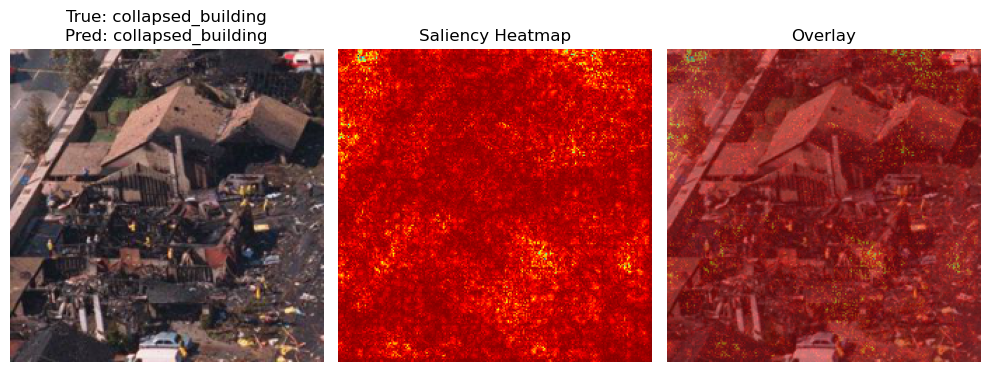

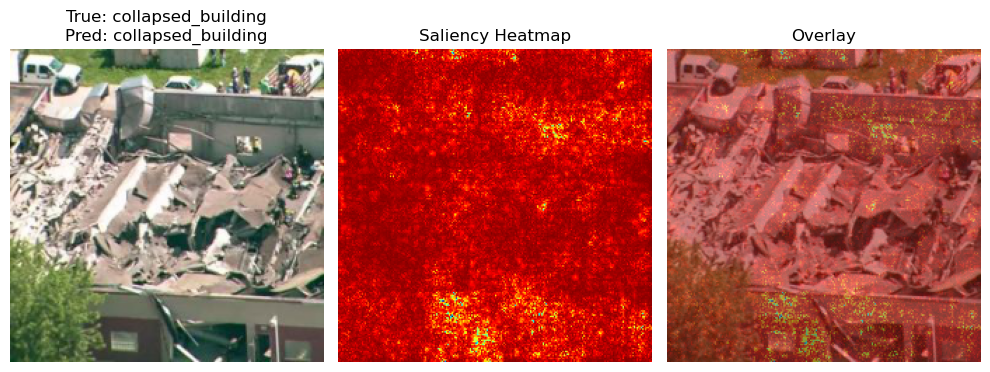

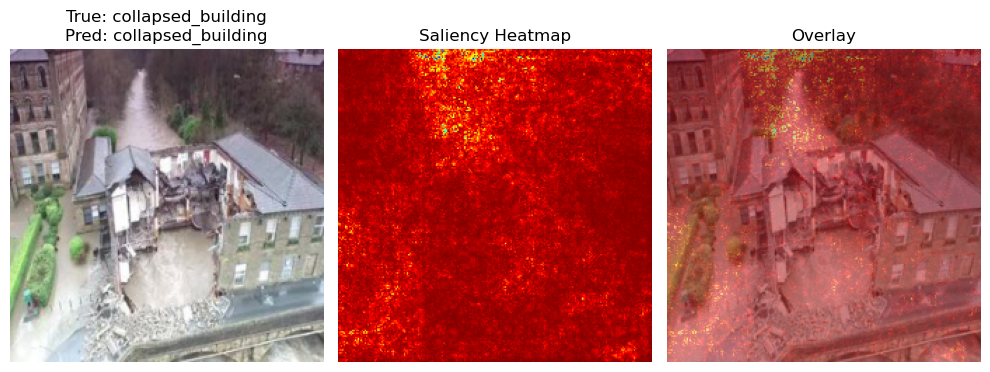


🟢 not Correctly classified: collapsed_building


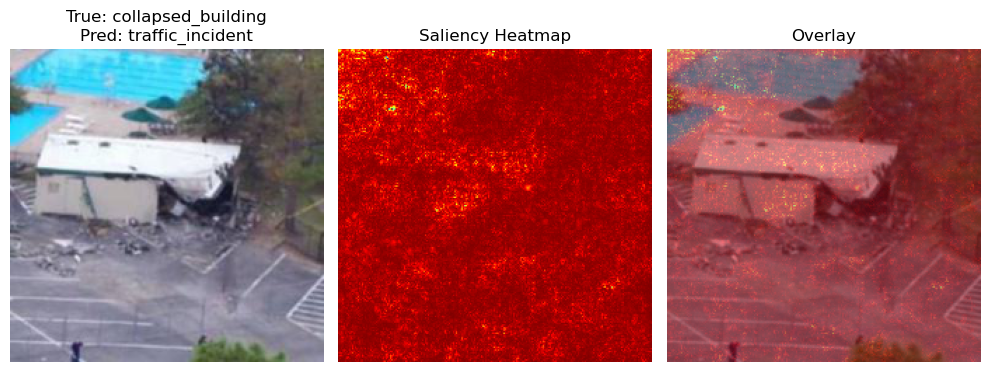

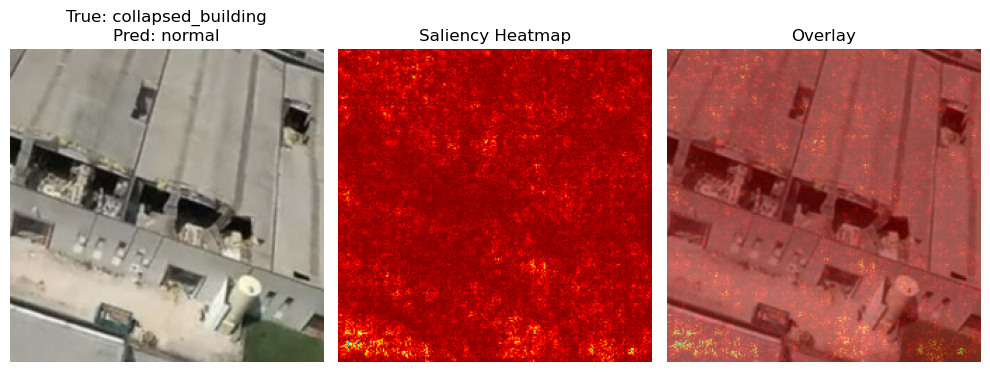

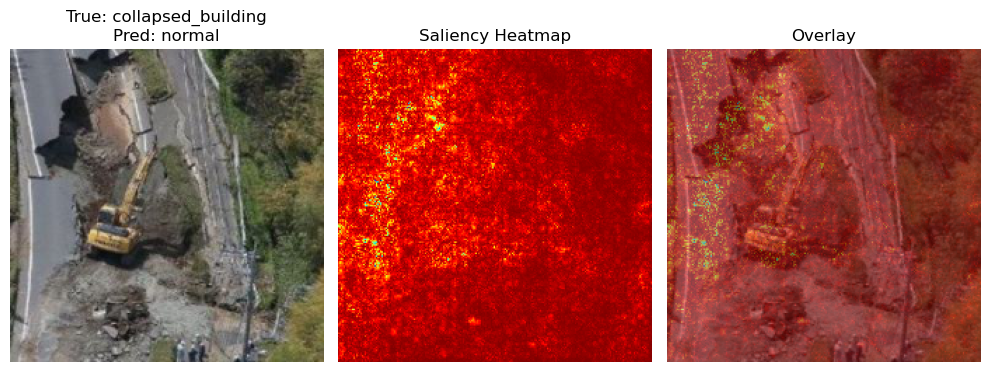


🟢 Correctly classified: fire


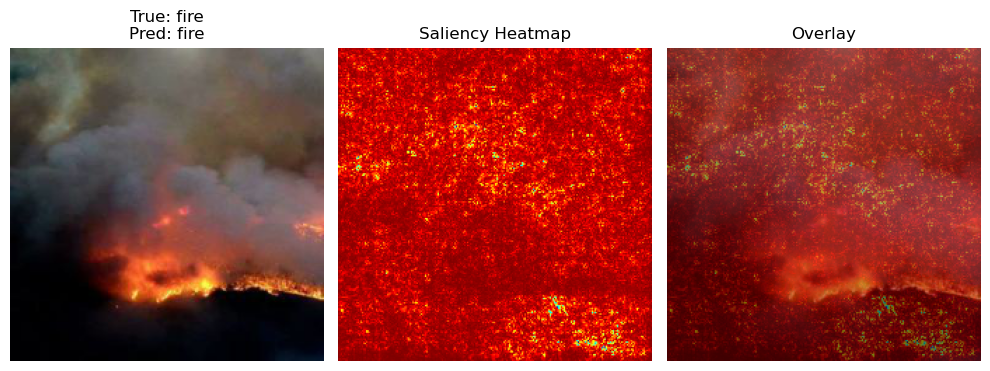

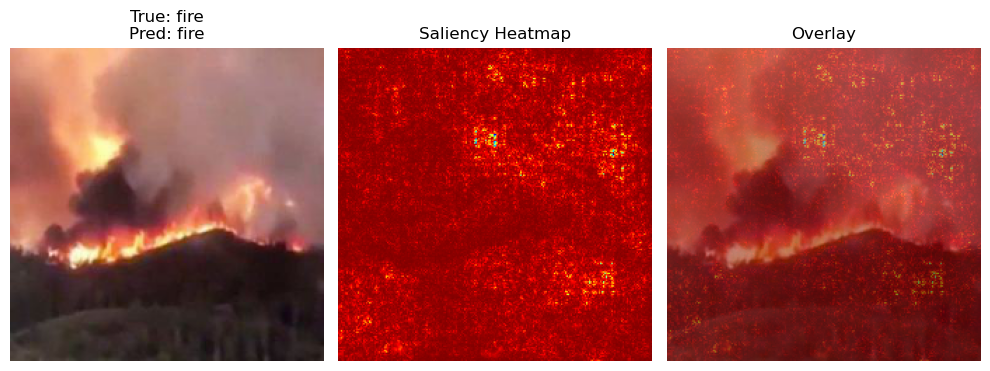

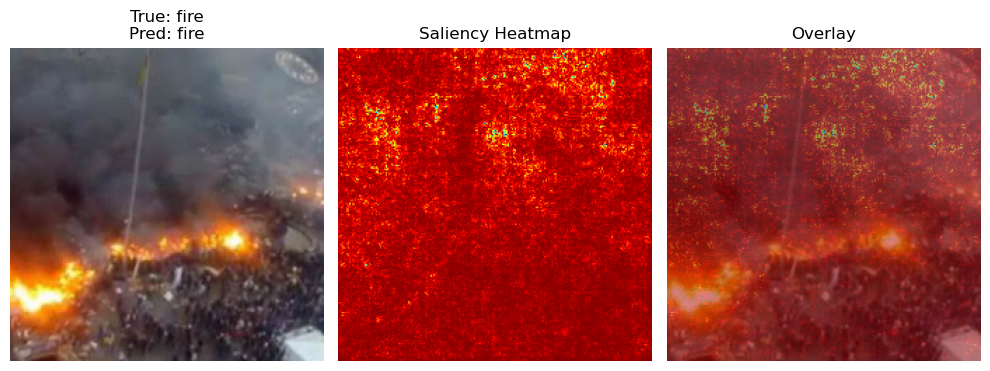


🟢 not Correctly classified: fire


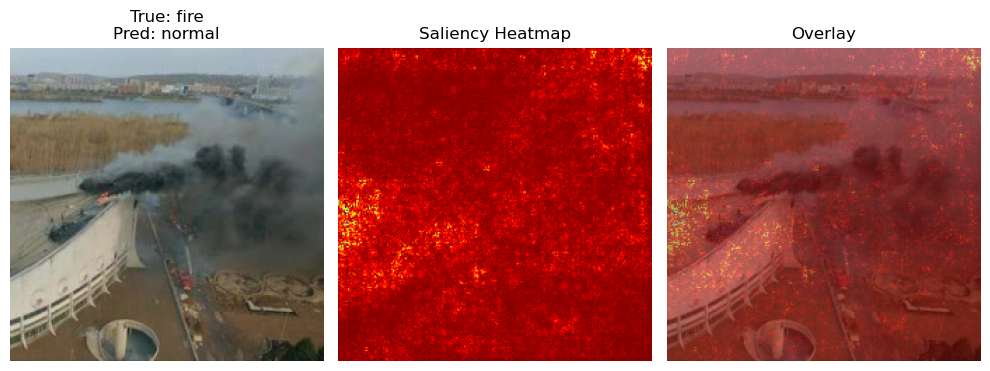

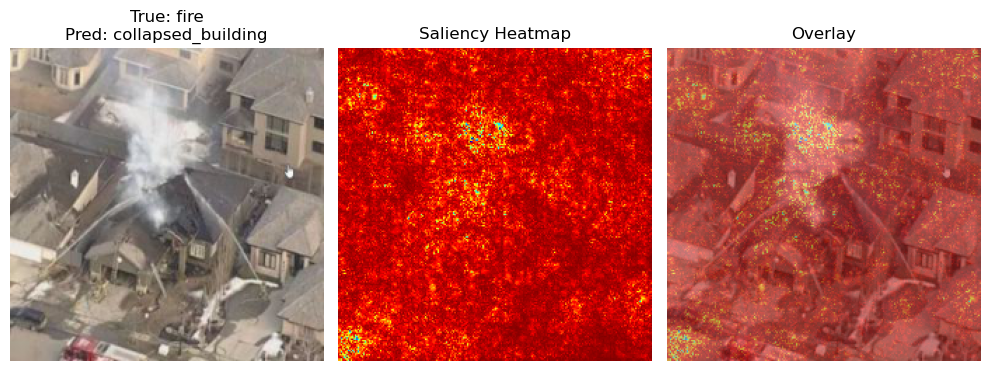

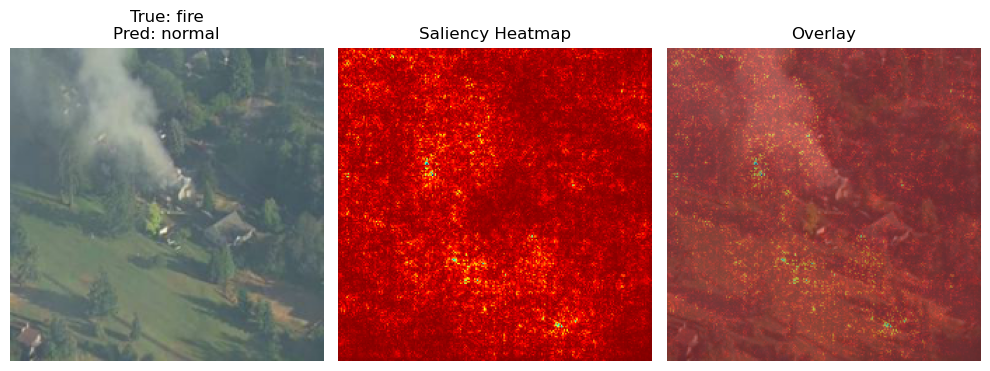


🟢 Correctly classified: flooded_areas


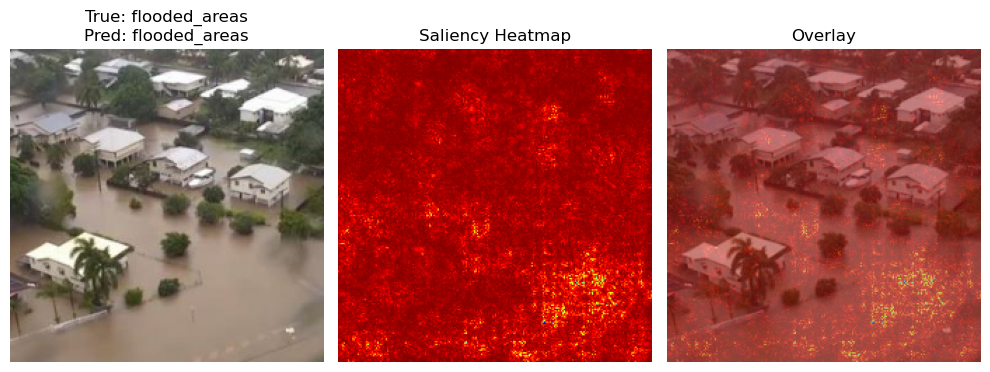

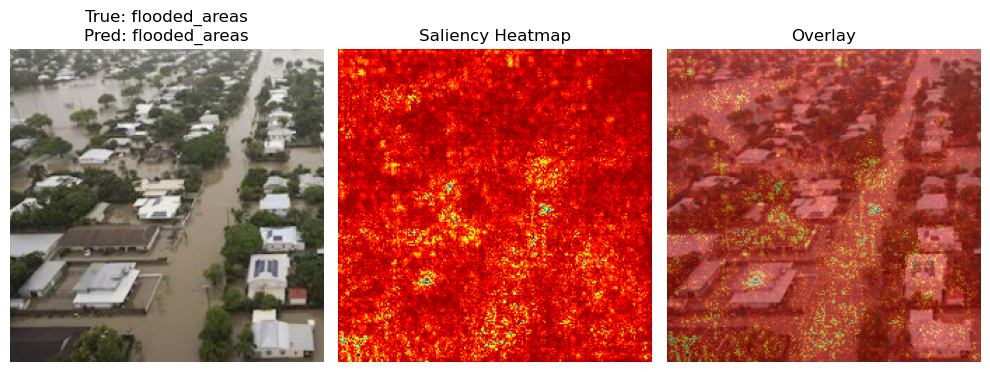

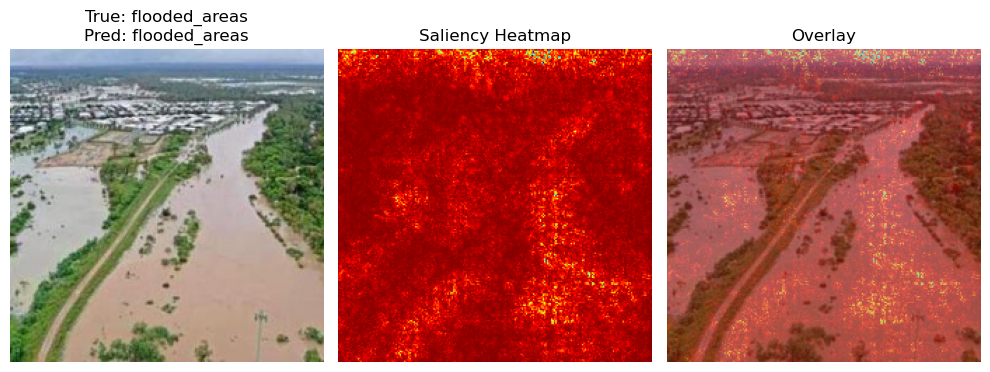


🟢 not Correctly classified: flooded_areas


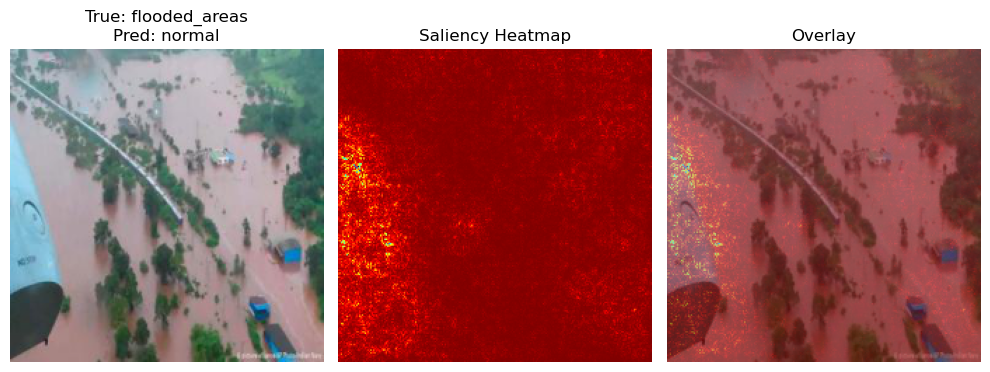

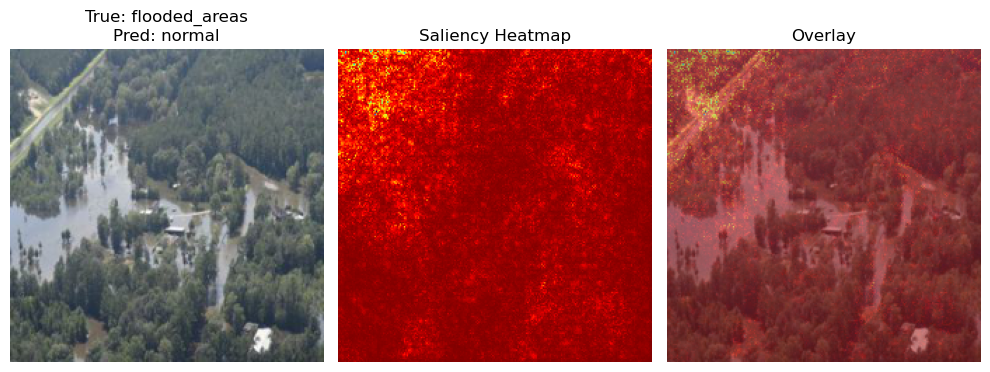

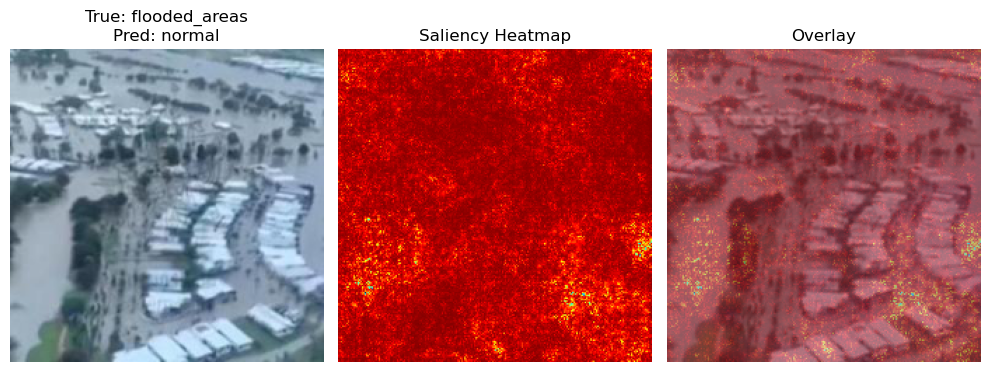


🟢 Correctly classified: normal


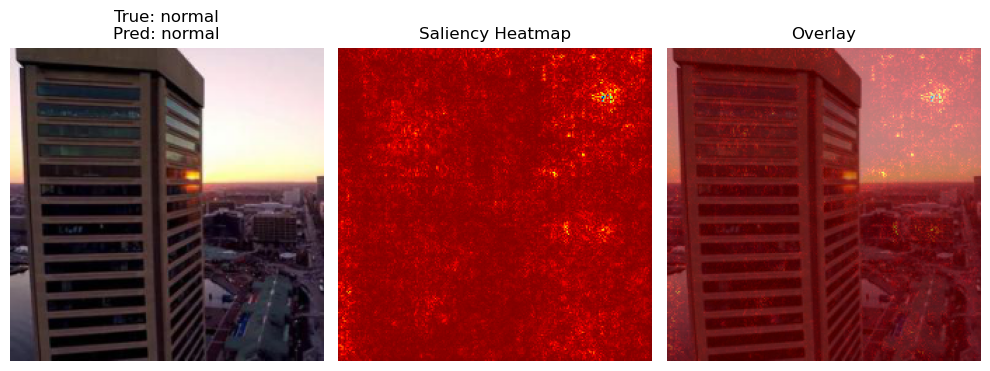

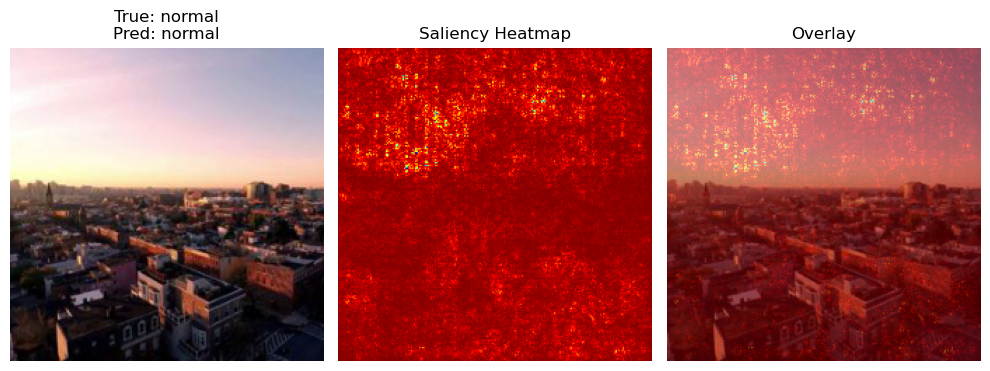

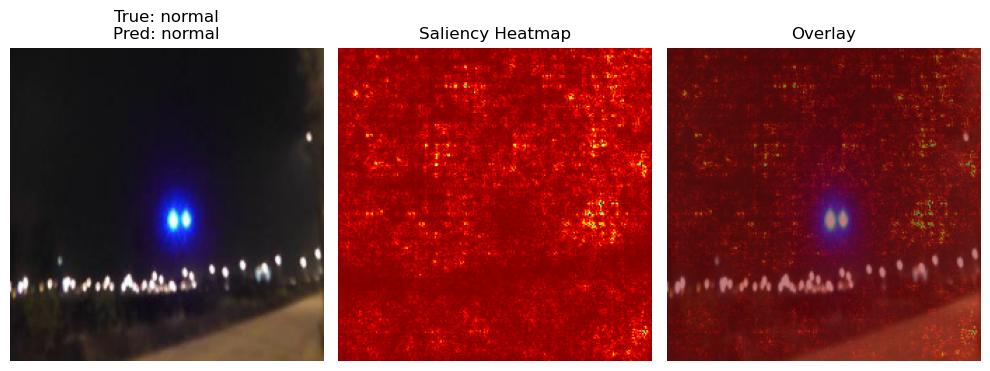


🟢 not Correctly classified: normal


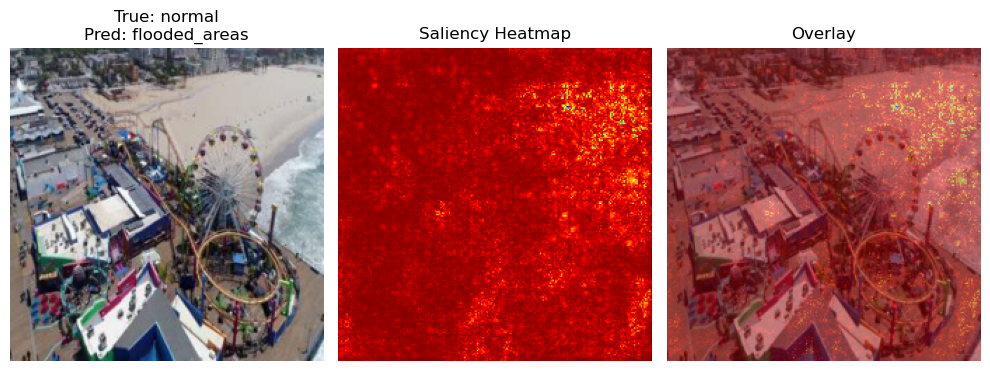

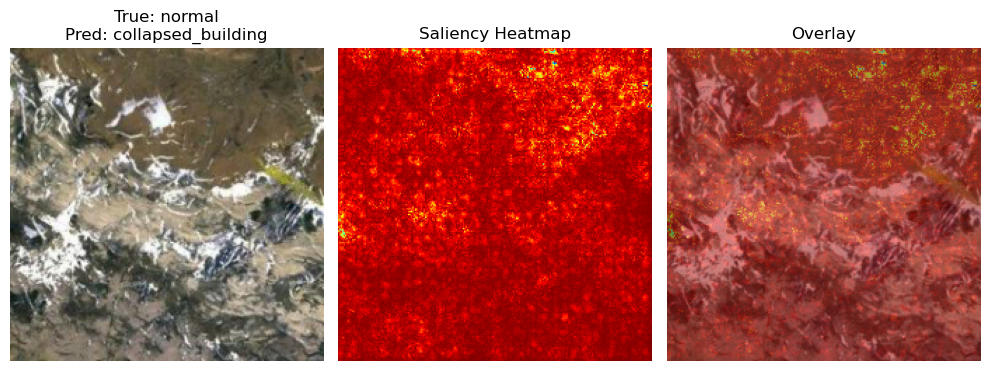

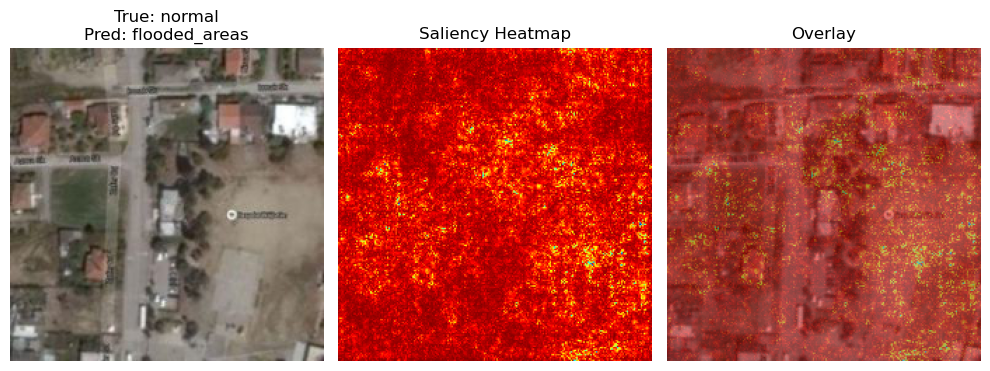


🟢 Correctly classified: traffic_incident


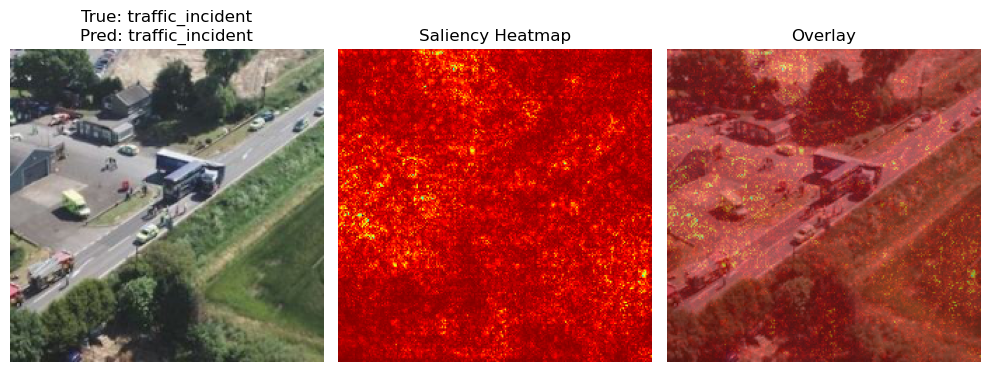

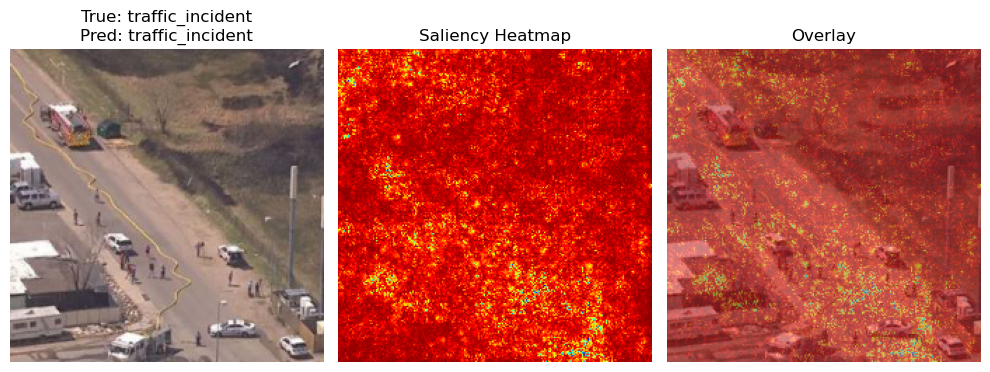

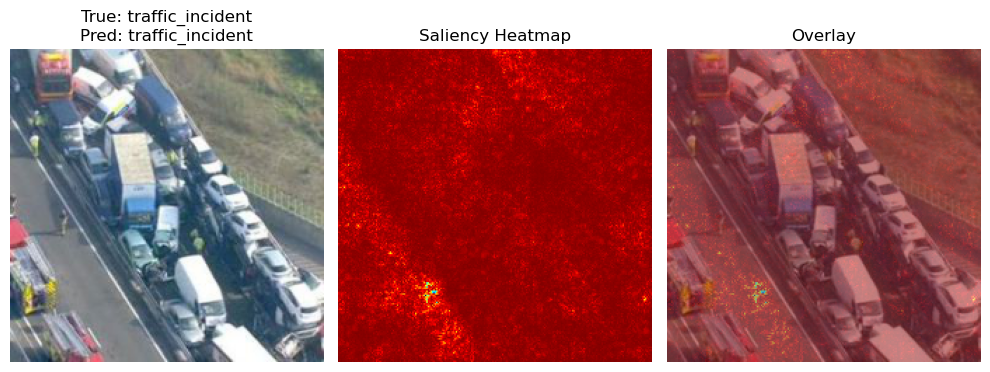


🟢 not Correctly classified: traffic_incident


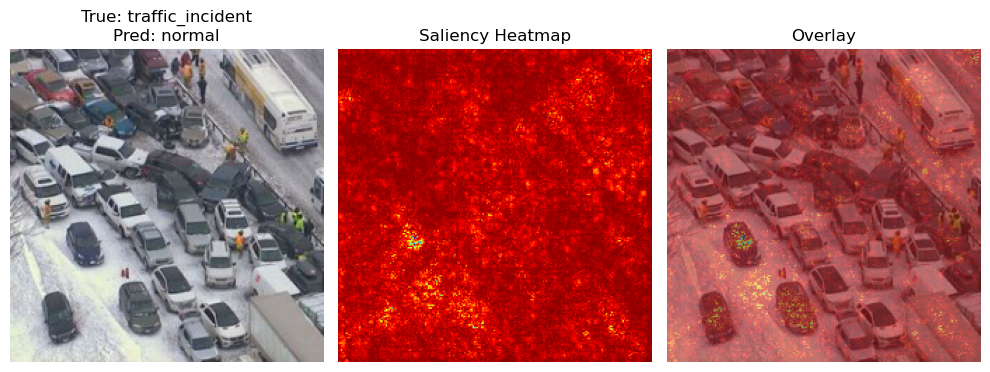

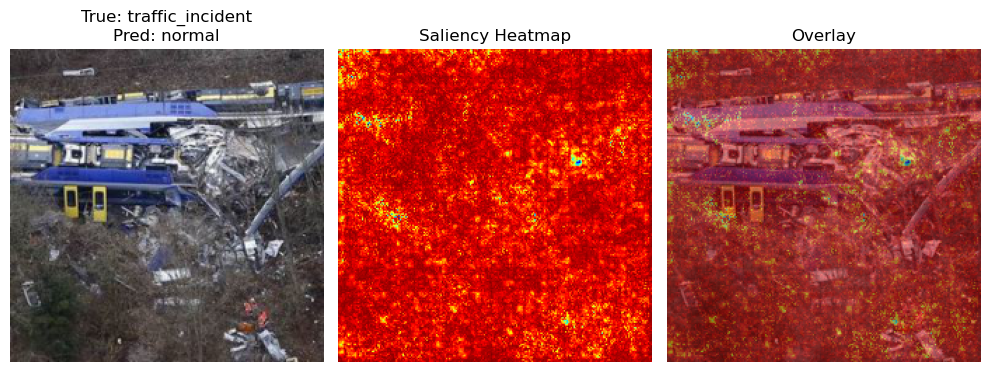

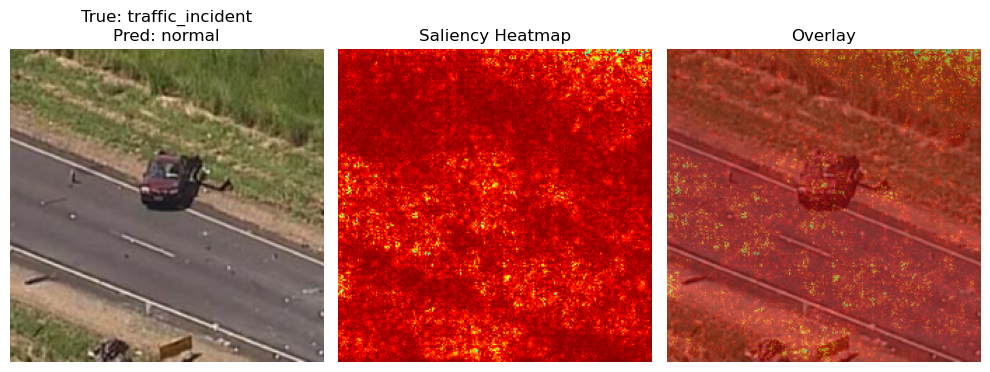

In [ ]:
import cv2

def printImage(img_path, true_label, pred_label):
    img = Image.open(img_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0).to(device)
    saliency_map = get_saliency_map(img_tensor.clone(), pred_label)
    saliency_map = (saliency_map - np.min(saliency_map)) / (np.max(saliency_map) - np.min(saliency_map))

    heatmap = cv2.applyColorMap(np.uint8(255 * saliency_map), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)  

    original_img = np.array(img).astype(np.uint8)  
    original_img = cv2.resize(original_img, (heatmap.shape[1], heatmap.shape[0]))

    if original_img.max() <= 1.0:
        original_img = (original_img * 255).astype(np.uint8)

    if len(heatmap.shape) == 2:
        heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    overlay = cv2.addWeighted(original_img, 0.5, heatmap, 0.5, 0)
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 3, 1)
    plt.title(f"True: {test_dataset.classes[true_label]}\nPred: {test_dataset.classes[pred_label]}")
    plt.imshow(original_img)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Saliency Heatmap")
    plt.imshow(heatmap)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
for class_name in test_dataset.classes:
    print(f"\n🟢 Correctly classified: {class_name}")
    for sample in correct_by_class[class_name]:
        printImage(*sample)
    print(f"\n🟢 not Correctly classified: {class_name}")
    for sample in incorrect_by_class[class_name]:
        printImage(*sample)
